<a href="https://colab.research.google.com/github/guylissak/object_detection_transfer_learning/blob/main/Object_detection_Bounding_box_PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
from torch import nn

torch.__version__

'2.1.0+cu121'

### 1. Download images and predictions

In [2]:
!wget https://pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com/bounding-box-regression/bounding-box-regression.zip
!unzip -qq bounding-box-regression.zip
%cd bounding-box-regression
!rm -rf output pyimagesearch
!rm predict.py train.py
!rm ../bounding-box-regression.zip

--2024-01-21 19:36:34--  https://pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com/bounding-box-regression/bounding-box-regression.zip
Resolving pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com (pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com)... 52.218.242.209, 52.92.239.98, 52.92.138.26, ...
Connecting to pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com (pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com)|52.218.242.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 92430845 (88M) [binary/octet-stream]
Saving to: ‘bounding-box-regression.zip’

bounding-box-regres 100%[===================>]  88.15M  34.4MB/s    in 2.6s    

2024-01-21 19:36:37 (34.4 MB/s) - ‘bounding-box-regression.zip’ saved [92430845/92430845]

/content/bounding-box-regression


#### 1.1 Plot random image

In [4]:
# Print device
from config import config as conf
conf.DEVICE

'cuda'

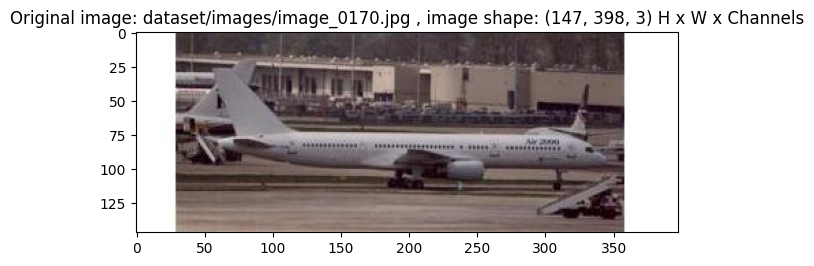

In [7]:
from utils import plot_original_image

plot_original_image(seed=42)

### 2. Prepare datasets and dataloaders

#### 2.1 Get pre trained model transforms to avoid performances degardations

In [8]:
from utils import get_pre_trained_model_and_weights

pre_trained_model, weights = get_pre_trained_model_and_weights()

weights.transforms()

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 89.6MB/s]


ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

####2.2 Set manual transforms

In [9]:
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode


custom_transforms = transforms.Compose([
    transforms.Resize((224, 224), interpolation=InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize the image
])

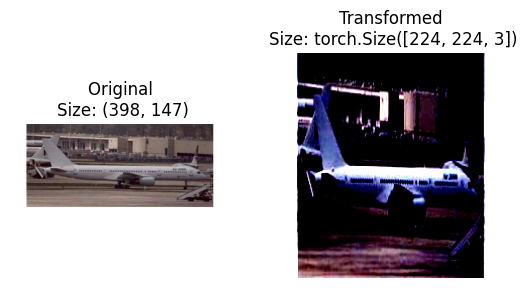

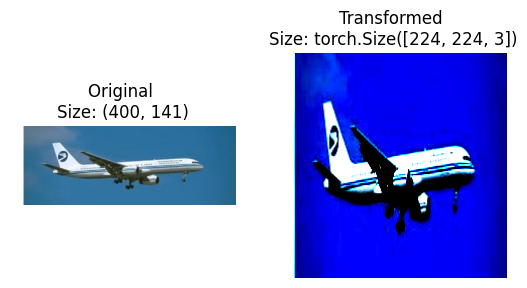

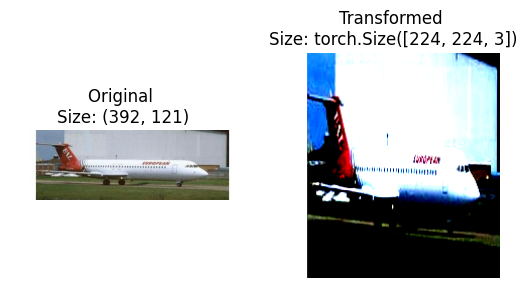

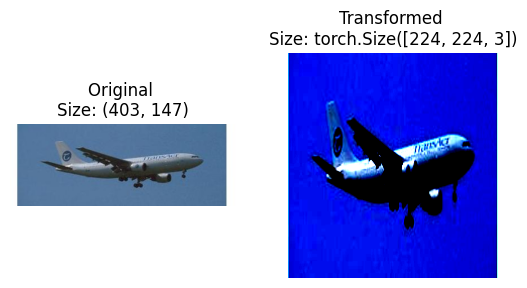

In [10]:
# Plot random transformed images
from config import config as conf
from pathlib import Path
from utils import plot_transformed_images

plot_transformed_images(image_paths=list(Path(conf.IMAGES_PATH).glob("*.jpg")),
                        transform=custom_transforms, n=4, seed=42)

### 2.3 Create train/ test datasets


1. Format annotations data
2. Split data to train and test
3. Create datasets



In [13]:
from config import config as conf
from pathlib import Path
from data_prepearation import prepare_annotations_data, split_train_test_data

targets = prepare_annotations_data()
images_path = sorted([str(p) for p in Path(conf.IMAGES_PATH).glob("*.jpg")])

train_images, test_images, train_targets, test_targets = split_train_test_data(images_paths=images_path,
                                                                               targets=targets,
                                                                               test_size=0.1)

Train images: 720
Test images: 80
Train targets: 720
Test targets: 80


In [14]:
from typing import List, Tuple
from torch.utils.data import Dataset
from PIL import Image

class AirplanesDataset(Dataset):
    def __init__(self, image_paths: List, bounding_boxes: List[Tuple[float, ...]], transform=None):
        self.image_paths = image_paths
        self.bounding_boxes = bounding_boxes
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load image and bounding box
        image_path = self.image_paths[idx]
        image = Image.open(image_path)
        bbox = self.bounding_boxes[idx]
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        # Scale and convert bounding boxes to tensor
        bbox_tensor = torch.tensor(bbox, dtype=torch.float32)
        return image, bbox_tensor

In [15]:
# Create datasets
train_dataset = AirplanesDataset(train_images, train_targets, transform=custom_transforms)
test_dataset = AirplanesDataset(test_images, test_targets, transform=custom_transforms)

In [16]:
print(f"Shape of image: {train_dataset[0][0].shape}, shape of target: {train_dataset[0][1].shape}")

Shape of image: torch.Size([3, 224, 224]), shape of target: torch.Size([4])


In [17]:
from config import config as conf

# Create dataloaders
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=conf.BATCH_SIZE, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=conf.BATCH_SIZE, shuffle=False)

In [18]:
image, target = next(iter(train_dataloader))
print(f"Image shape: {image.shape} -> [batch_size, color_channels, height, width]")
print(f"Target shape: {target.shape} -> [batch_size, 4]")

Image shape: torch.Size([32, 3, 224, 224]) -> [batch_size, color_channels, height, width]
Target shape: torch.Size([32, 4]) -> [batch_size, 4]


### 3. Build model

In [19]:
!pip install torchinfo

In [21]:
pre_trained_model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

In [22]:
from builder import build_model
model = build_model(model=pre_trained_model, with_model_summary=True)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 224, 224]     [1, 4]               --                   Partial
├─Sequential (features)                                      [1, 3, 224, 224]     [1, 1280, 7, 7]      --                   False
│    └─Conv2dNormActivation (0)                              [1, 3, 224, 224]     [1, 32, 112, 112]    --                   False
│    │    └─Conv2d (0)                                       [1, 3, 224, 224]     [1, 32, 112, 112]    (864)                False
│    │    └─BatchNorm2d (1)                                  [1, 32, 112, 112]    [1, 32, 112, 112]    (64)                 False
│    │    └─SiLU (2)                                         [1, 32, 112, 112]    [1, 32, 112, 112]    --                   --
│    └─Sequential (1)                                        [1, 32, 112, 112]    [1, 1

### 4. Train and evaluate the model

In [24]:
from config import config as conf
from timeit import default_timer as timer
from model_train import train, test_step, train_step

# Set optimizer and loss fn
optimizer = torch.optim.Adam(model.parameters(), lr=conf.INIT_LR)
loss_fn = nn.MSELoss()

# Set seed for reproducibility
torch.manual_seed(42)
torch.cuda.manual_seed(42)

start_time = timer()

# Start training
results = train(model=model,
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=conf.NUM_EPOCHS,
                       device=conf.DEVICE)


end_time = timer()
print(f"[INFO] Total training time: {end_time - start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.0197 | test_loss: 0.0048
Epoch: 2 | train_loss: 0.0047 | test_loss: 0.0028
Epoch: 3 | train_loss: 0.0028 | test_loss: 0.0022
Epoch: 4 | train_loss: 0.0022 | test_loss: 0.0021
Epoch: 5 | train_loss: 0.0017 | test_loss: 0.0024
Epoch: 6 | train_loss: 0.0016 | test_loss: 0.0016
Epoch: 7 | train_loss: 0.0012 | test_loss: 0.0016
Epoch: 8 | train_loss: 0.0012 | test_loss: 0.0015
Epoch: 9 | train_loss: 0.0011 | test_loss: 0.0015
Epoch: 10 | train_loss: 0.0012 | test_loss: 0.0013
Epoch: 11 | train_loss: 0.0010 | test_loss: 0.0016
Epoch: 12 | train_loss: 0.0010 | test_loss: 0.0014
Epoch: 13 | train_loss: 0.0009 | test_loss: 0.0011
Epoch: 14 | train_loss: 0.0008 | test_loss: 0.0011
Epoch: 15 | train_loss: 0.0007 | test_loss: 0.0011
Epoch: 16 | train_loss: 0.0007 | test_loss: 0.0011
Epoch: 17 | train_loss: 0.0009 | test_loss: 0.0011
Epoch: 18 | train_loss: 0.0007 | test_loss: 0.0011
Epoch: 19 | train_loss: 0.0006 | test_loss: 0.0009
Epoch: 20 | train_loss: 0.0006 | test_lo

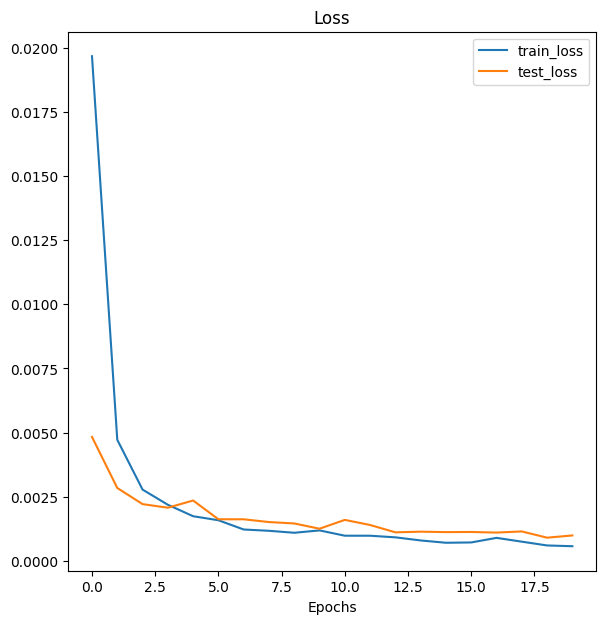

In [25]:
from utils import plot_loss_curves

plot_loss_curves(results)

In [45]:
from pathlib import Path
from config import config as conf

MODEL_PATH = Path(conf.MODELS_OUTPUT_PATH)
MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                 exist_ok=True # if models directory already exists, don't error
)

MODEL_NAME = "bbox_regression_model.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# Save the model state dict
print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model.state_dict(), # only saving the state_dict() only saves the learned parameters
           f=MODEL_SAVE_PATH)

Saving model to: models/bbox_regression_model.pth


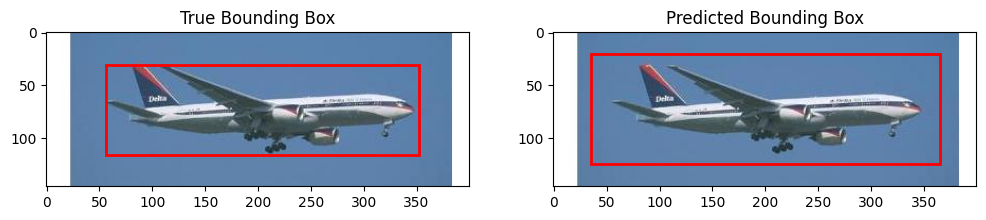

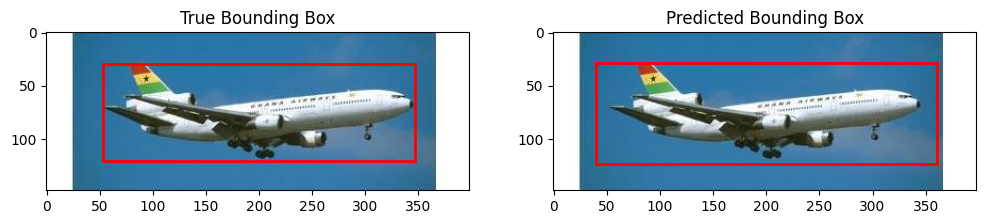

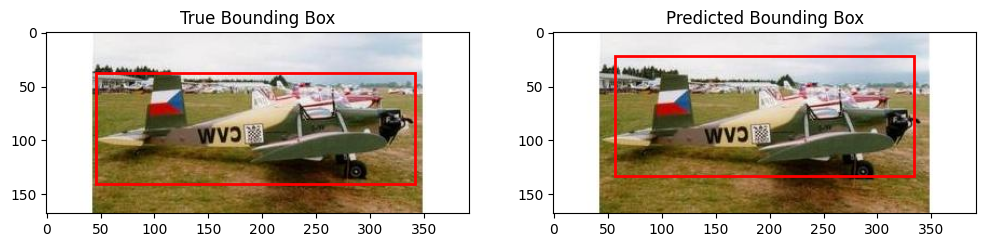

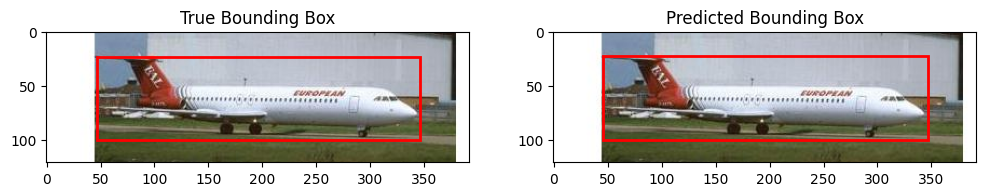

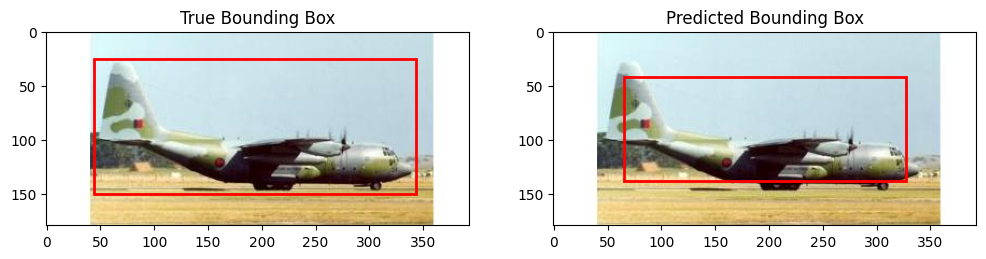

...

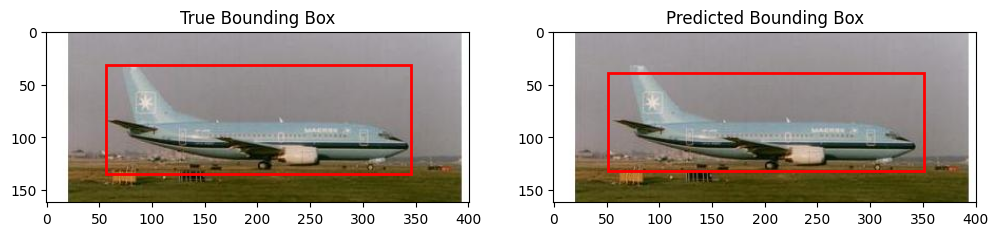

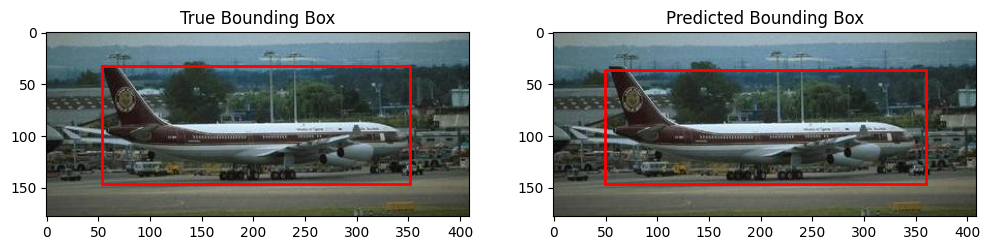

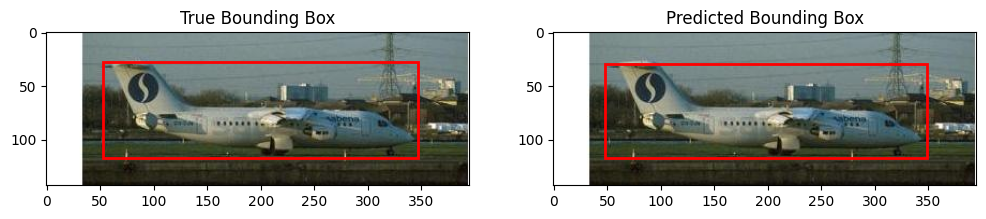

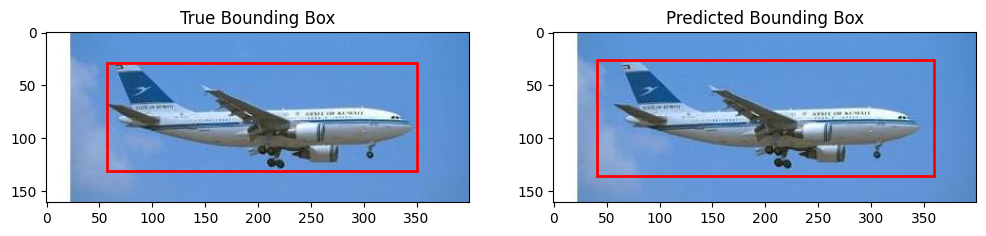

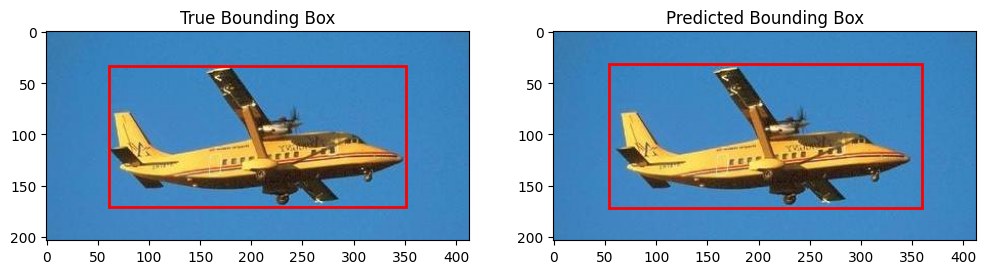

In [27]:
# Plot actual bounding boxes vs predicted bounding boxes from test data.
import matplotlib.pyplot as plt
from PIL import Image
from utils import scale_bbox_to_image, create_rectangle_plot
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)

model.eval()
with torch.inference_mode():
    for idx, (images, bboxs) in enumerate(val_loader):
        images, bboxs = images.to(conf.DEVICE), bboxs.to(conf.DEVICE)
        predictions = model(images)
        predictions = predictions.cpu()
        bboxs = bboxs.cpu()
        for i in range(images.shape[0]):
            fig, ax = plt.subplots(1, 2, figsize=(12, 6))

            # Get the image path
            img_path = test_dataset.image_paths[idx * val_loader.batch_size + i]

            image = Image.open(img_path).convert("RGB")
            original_width, original_height = image.size

            # Display the true bounding box
            ax[0].imshow(image)
            actual_rect = create_rectangle_plot(original_height=original_height,
                                                original_width= original_width,
                                                bbox_tensor = bboxs[i],
                                                ax=ax[0])
            ax[0].set_title('True Bounding Box')
            ax[0].add_patch(actual_rect)

            # Display the predicted bounding box
            ax[1].imshow(image)
            predicted_rect = create_rectangle_plot(original_height=original_height,
                                                   original_width= original_width,
                                                   bbox_tensor = predictions[i],
                                                   ax=ax[1])
            ax[1].set_title('Predicted Bounding Box')
            ax[1].add_patch(predicted_rect)

            # Show the image
            plt.show()


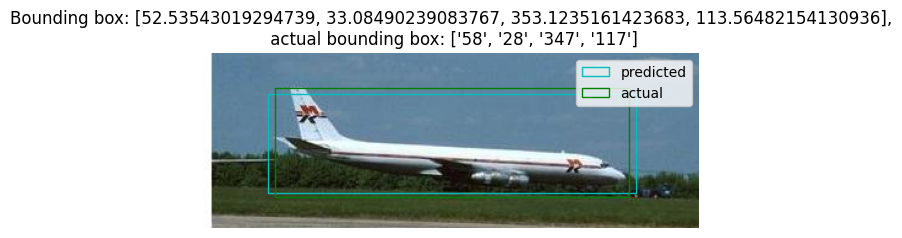

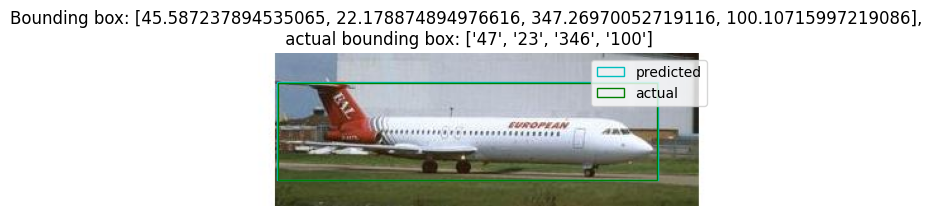

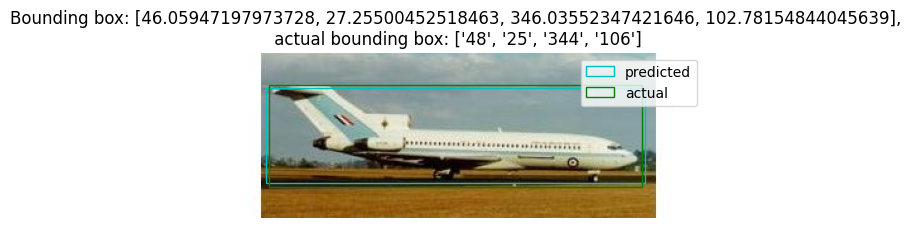

In [43]:
# Custom image inference
import random
from utils import inference_custom_image

# get actual bounding box for visualization
with open(conf.ANNOTS_PATH, 'r') as file:
    csv_annots = file.read().strip().split("\n")

random.seed(42)
samples = random.sample(test_images, 3)
# Pick random images
inputs = [input.split("/")[2] for input in samples]

for input in inputs:
    # Get the annotations for the image
    annotations = None
    for annot in csv_annots:
      if input == annot.split(",")[0]:
        annotations = annot.split(",")[1:]
        break

    # Inference with custom method
    inference_custom_image(model=model,
                    image_path=f"dataset/images/{input}",
                    transform=custom_transforms,
                         annotations=annotations)